Based on the 'activation maximization' technique suggested in [this](https://pdfs.semanticscholar.org/65d9/94fb778a8d9e0f632659fb33a082949a50d3.pdf) paper. 

We will view the layers of the (pretrained) GoogLeNet just like in [this](https://distill.pub/2017/feature-visualization/) post.

## Import useful libraries 

In [1]:
import torch

In [2]:
torch.cuda.is_available()

True

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from torchvision import models

## Import a pretrained GoogLeNet

In [4]:
model = models.googlenet(pretrained = True)

model

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [5]:
# We now freeze the parameters of our pretrained model
for param in model.parameters():
    param.requires_grad_(False)

In [6]:
# layer: inception4a
model.inception4a

Inception(
  (branch1): BasicConv2d(
    (conv): Conv2d(480, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (branch2): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(96, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(96, 208, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(208, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (branch3): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(480, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(16, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): Batc

In [7]:
# We will register a forward hook to get the output of the layers

activation = {} # to store the activation  of a layer
def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        activation[name] = o
       
    return hook


# register a forward hook for layer inception4a i.e. the first inception layer
model.inception4a.register_forward_hook(create_hook('4a'))

In [8]:
# normalize the input image to have appropriate mean and standard deviation as specified by pytorch
from torchvision import transforms



normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])


# undo the above normalization if and when the need arises 
denormalize = transforms.Normalize(mean = [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                   std = [1/0.229, 1/0.224, 1/0.225] )

In [9]:
from torch import optim

In [10]:
# function to massage img_tensor for using as input to plt.imshow()
def image_converter(im):
    
    # move the image to cpu
    im_copy = im.cpu()
    
    # for plt.imshow() the channel-dimension is the last
    # therefore use transpose to permute 
    im_copy = denormalize(im_copy.clone().detach()).numpy().transpose(1,2,0)
    # clip negative values as plt.imshow() only accepts 
    # floating values in range [0,1] and integers in range [0,255]
    im_copy = im_copy.clip(0, 1) 
    
    return im_copy


## Trial 1: Naive Activation maximization

In this section we define the activation of a unit to be the mean of the elements in the output tensor produced by it.

### Create an input image 

The starting image will consist of random values for the pixels

In [11]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


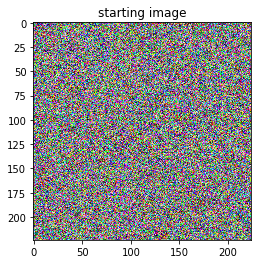

In [12]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [13]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda
googlenet is on cuda: True
img_tensor is on cuda: True


In [14]:
# understanding the shape of the output produced by a given layer
image = img_tensor.clone().detach().to(device).requires_grad_(True)
model(image.unsqueeze(0))
activation['4a'].shape

torch.Size([1, 512, 14, 14])

From above we see that the 'inception4a' layer of googlenet produces an output tensor having 512 channels with Height = Width = 14.

The 512 channels produced above can be understood as follows:

The inception4a layer consists of 4 independent branches whose output is collated along the batch dimension. 

 - 1) branch 1: This is basic 2d conv. layer consisting of 192 units. Thus it contributes 192 to the  number of channels in the final output
 
 
 - 2) branch 2: This is has two conv. layers applied sequentially. The second conv. layer contains 208 units. This branch therefore contributes 208 to the number of channels in the final output
 
 
 
 - 3) branch 3: This also has two conv. layers applied sequentially and contributes 48 to the number of channels in the final output
 
 
 
 - 4) branch 4: This has a maxpool layer followed by a 2d conv. layer. This branch contributes 64 to the final number of channels. 
 
We thus see that the total number of channels in the final output of 'inception4a' should be 192 + 208 + 48 + 64 = 512 which matches with the output of the previous cell.  

### Generating the final image maximizing a unit's output

epoch: 0/10000, activation: 0.024361494928598404


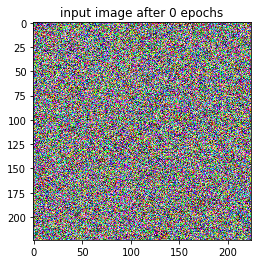

epoch: 1000/10000, activation: 29.481779098510742


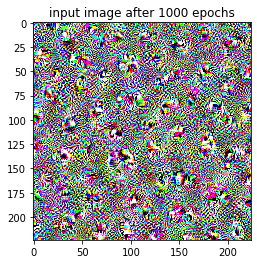

epoch: 2000/10000, activation: 50.73944091796875


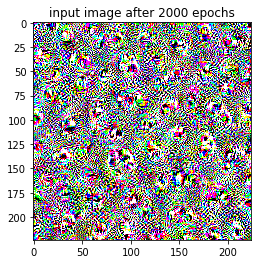

epoch: 3000/10000, activation: 72.64332580566406


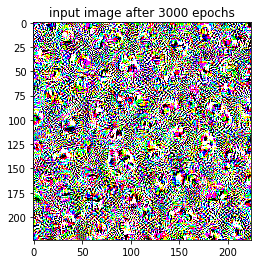

epoch: 4000/10000, activation: 95.24925994873047


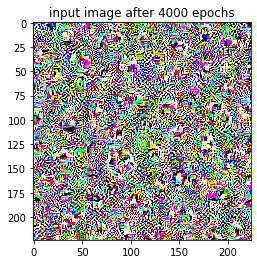

epoch: 5000/10000, activation: 118.13880157470703


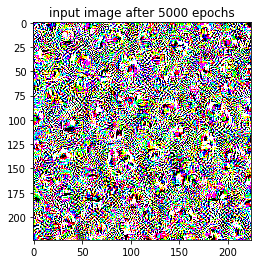

epoch: 6000/10000, activation: 141.3564453125


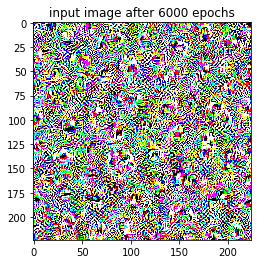

epoch: 7000/10000, activation: 164.7440643310547


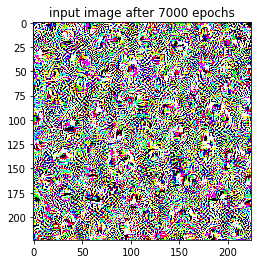

epoch: 8000/10000, activation: 188.3518829345703


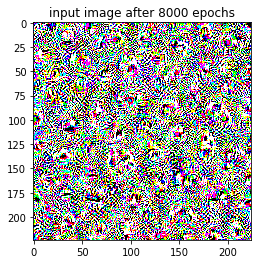

epoch: 9000/10000, activation: 212.0640106201172


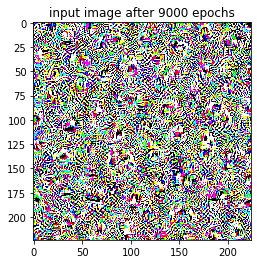

In [15]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    loss = -layer_out[0, unit_idx].mean() 
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()


The final image does seeem to have some very high frequency patterns. However, the high frequency behaviour obscures any interpretation of what the neuron seems to learning. 

## Trial 2: Activation Maximization with slowly upscaling the image

I found that my code above is quite similar to the implementation of feature visualization with activation maximization in [this](https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030) blog post. There the author also discusses the emerges of high frequence patterns in the image and how he got around it by initially feeding smaller sized images and slowing upscaling them. Let us try this.

In [84]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


In [85]:
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 20 # no. of times to optimize an input image before upscaling

In [86]:
import cv2 # for resizing images
# Note that we could have also used torchvision.transforms.Resize() method provided in Pytorch
# we used cv2 for no particular reason other than to try cv2
# for more info on torchvision.transforms.Resize() see https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize


# e.g. of how to resize images using cv2
# just like in plt.imshow() cv2 also expects the channel info. to be in the last axis
# the documentation for cv2.resize() recommends using inter_cubic for interpolation when upscaling
cv2.resize(image_converter(img_tensor), dsize = (0,0) , fx = upscaling_factor, fy = upscaling_factor, 
           interpolation = cv2.INTER_CUBIC).shape 

(235, 235, 3)

In [87]:
# move the model to CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Creating a initial image with random pixels

In [88]:
# initial random image
H = 28 # height of image
W = 28 # width of image
im = np.single(np.random.uniform(0, 1, (3, H, W))) # we need the pixel values to be of type float32 
img_tensor = normalize(torch.from_numpy(im)).to(device).requires_grad_(True)
print('image shape: {}, device: {}, dtype: {}'.format(img_tensor.shape, 
                                                      img_tensor.device, img_tensor.dtype ))

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

image shape: torch.Size([3, 28, 28]), device: cuda:0, dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: 0.8882796168327332
end mag_epoch: 0, activation: 18.982938766479492


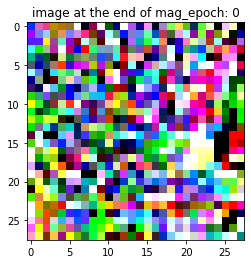

begin mag_epoch 1, activation: 5.743788719177246
end mag_epoch: 1, activation: 28.654890060424805


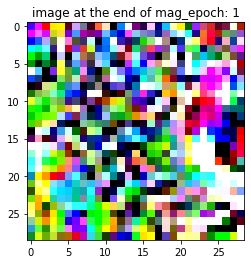

begin mag_epoch 2, activation: 8.629809379577637
end mag_epoch: 2, activation: 32.5224609375


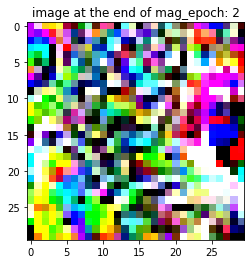

begin mag_epoch 3, activation: 4.184707164764404
end mag_epoch: 3, activation: 22.299091339111328


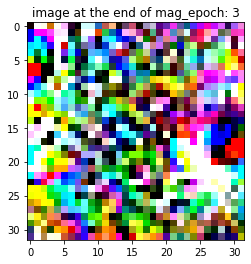

begin mag_epoch 4, activation: 6.04392147064209
end mag_epoch: 4, activation: 28.057294845581055


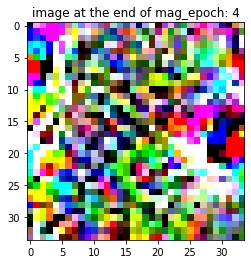

begin mag_epoch 5, activation: 6.82354211807251
end mag_epoch: 5, activation: 27.122568130493164


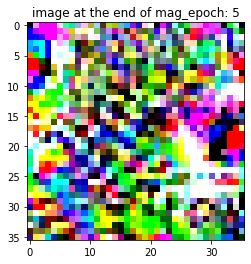

begin mag_epoch 6, activation: 7.177530288696289
end mag_epoch: 6, activation: 29.756702423095703


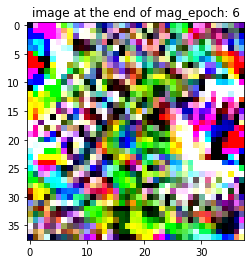

begin mag_epoch 7, activation: 6.488224506378174
end mag_epoch: 7, activation: 30.84030532836914


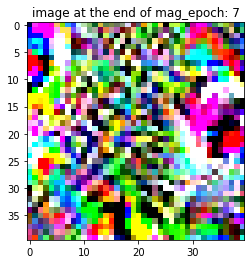

begin mag_epoch 8, activation: 8.483970642089844
end mag_epoch: 8, activation: 34.63468551635742


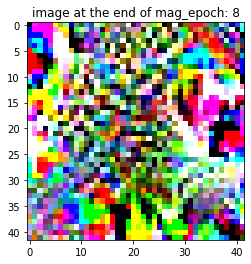

begin mag_epoch 9, activation: 8.771142959594727
end mag_epoch: 9, activation: 35.12010955810547


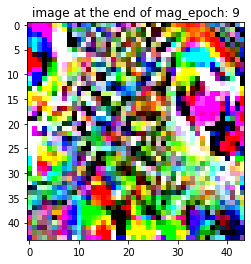

begin mag_epoch 10, activation: 8.456588745117188
end mag_epoch: 10, activation: 38.566898345947266


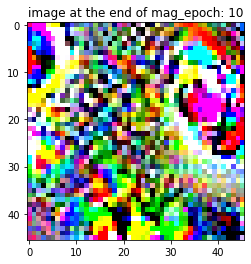

begin mag_epoch 11, activation: 5.634208679199219
end mag_epoch: 11, activation: 26.902503967285156


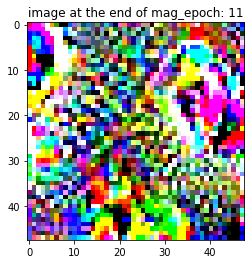

begin mag_epoch 12, activation: 6.296469211578369
end mag_epoch: 12, activation: 27.619821548461914


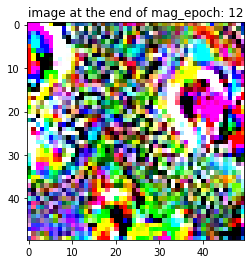

begin mag_epoch 13, activation: 6.495039939880371
end mag_epoch: 13, activation: 29.56787109375


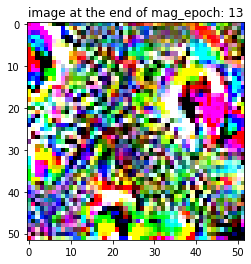

begin mag_epoch 14, activation: 5.179808616638184
end mag_epoch: 14, activation: 29.754297256469727


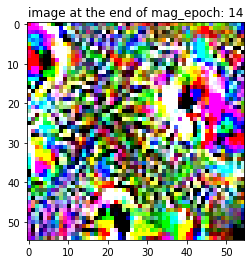

begin mag_epoch 15, activation: 6.036262035369873
end mag_epoch: 15, activation: 30.25357437133789


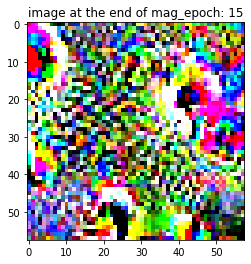

begin mag_epoch 16, activation: 6.855642318725586
end mag_epoch: 16, activation: 31.820369720458984


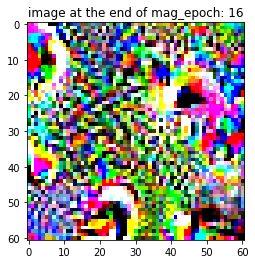

begin mag_epoch 17, activation: 5.08596134185791
end mag_epoch: 17, activation: 26.91208839416504


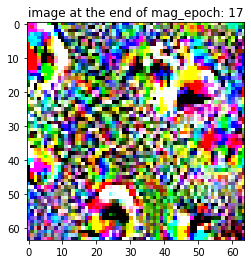

begin mag_epoch 18, activation: 5.611894607543945
end mag_epoch: 18, activation: 26.824539184570312


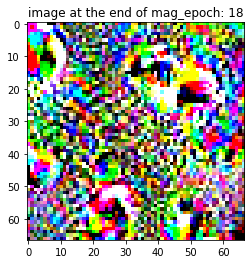

begin mag_epoch 19, activation: 5.170938968658447
end mag_epoch: 19, activation: 26.365673065185547


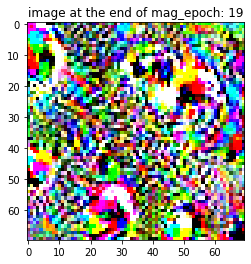

begin mag_epoch 20, activation: 5.695950984954834
end mag_epoch: 20, activation: 27.188928604125977


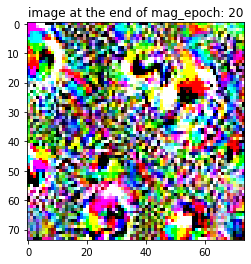

begin mag_epoch 21, activation: 5.975698471069336
end mag_epoch: 21, activation: 29.27399444580078


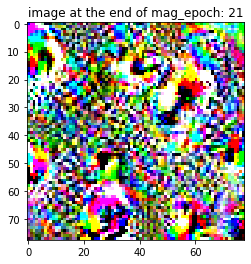

begin mag_epoch 22, activation: 5.142000675201416
end mag_epoch: 22, activation: 26.400259017944336


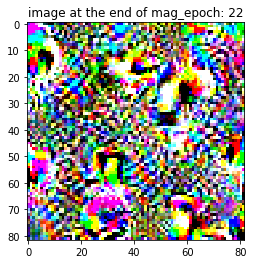

begin mag_epoch 23, activation: 5.326861381530762
end mag_epoch: 23, activation: 28.820209503173828


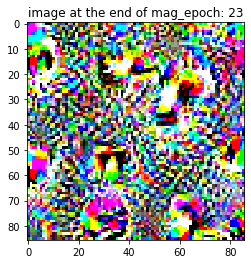

begin mag_epoch 24, activation: 6.482631683349609
end mag_epoch: 24, activation: 28.55868911743164


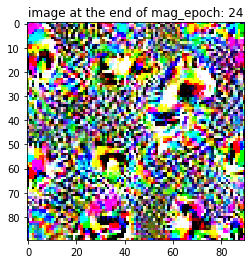

begin mag_epoch 25, activation: 6.105302810668945
end mag_epoch: 25, activation: 29.982345581054688


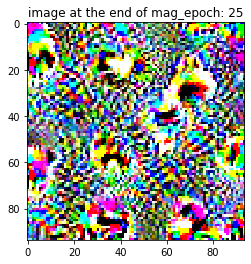

begin mag_epoch 26, activation: 5.1715288162231445
end mag_epoch: 26, activation: 25.656564712524414


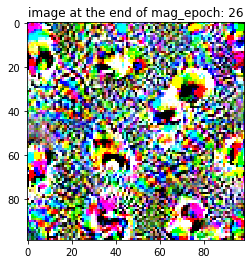

begin mag_epoch 27, activation: 6.016640663146973
end mag_epoch: 27, activation: 27.687551498413086


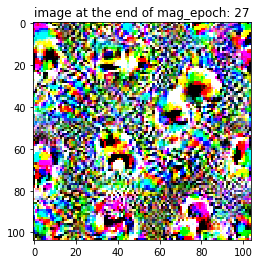

begin mag_epoch 28, activation: 6.077055931091309
end mag_epoch: 28, activation: 28.592041015625


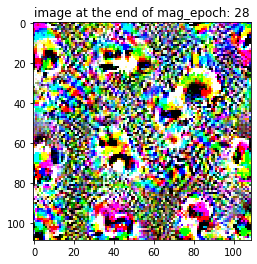

begin mag_epoch 29, activation: 5.299001216888428
end mag_epoch: 29, activation: 25.623640060424805


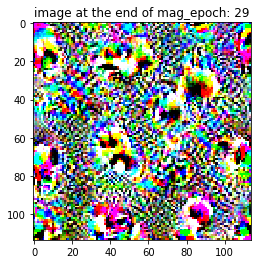

begin mag_epoch 30, activation: 5.166896820068359
end mag_epoch: 30, activation: 26.8083438873291


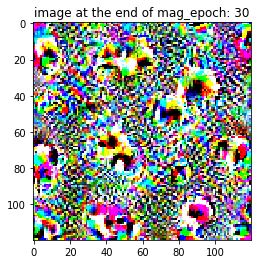

begin mag_epoch 31, activation: 5.711336135864258
end mag_epoch: 31, activation: 28.378477096557617


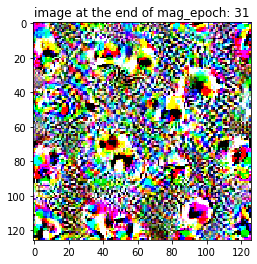

begin mag_epoch 32, activation: 5.179440498352051
end mag_epoch: 32, activation: 27.43035888671875


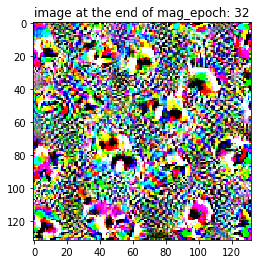

begin mag_epoch 33, activation: 5.427289962768555
end mag_epoch: 33, activation: 27.565174102783203


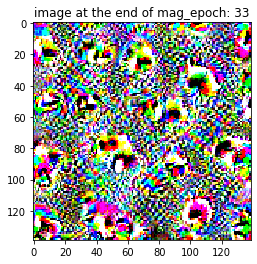

begin mag_epoch 34, activation: 5.10068941116333
end mag_epoch: 34, activation: 25.611059188842773


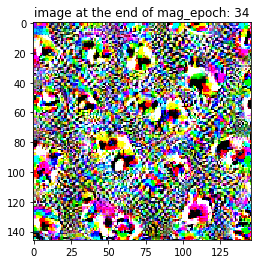

begin mag_epoch 35, activation: 5.224944591522217
end mag_epoch: 35, activation: 26.014461517333984


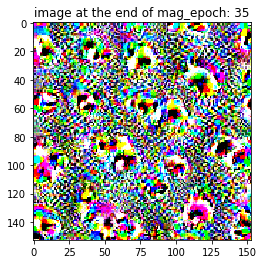

begin mag_epoch 36, activation: 4.877203464508057
end mag_epoch: 36, activation: 26.358816146850586


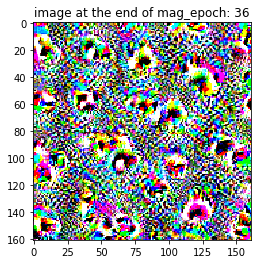

begin mag_epoch 37, activation: 5.082779884338379
end mag_epoch: 37, activation: 26.680631637573242


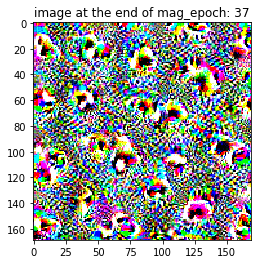

begin mag_epoch 38, activation: 5.094511985778809
end mag_epoch: 38, activation: 25.465898513793945


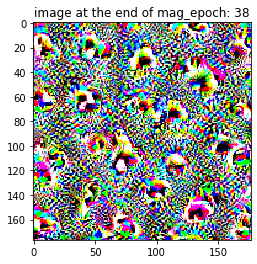

begin mag_epoch 39, activation: 5.110651969909668
end mag_epoch: 39, activation: 26.656837463378906


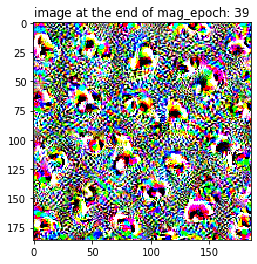

begin mag_epoch 40, activation: 5.006280422210693
end mag_epoch: 40, activation: 26.297821044921875


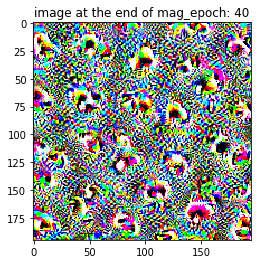

begin mag_epoch 41, activation: 5.062628269195557
end mag_epoch: 41, activation: 26.9825439453125


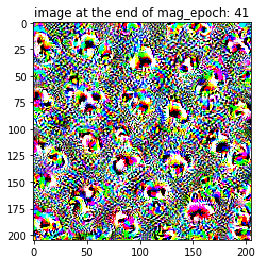

begin mag_epoch 42, activation: 4.88804292678833
end mag_epoch: 42, activation: 26.796777725219727


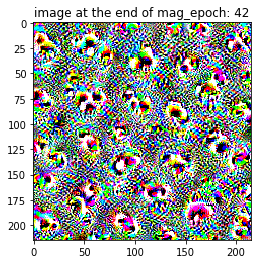

begin mag_epoch 43, activation: 4.706080913543701
end mag_epoch: 43, activation: 26.110937118530273


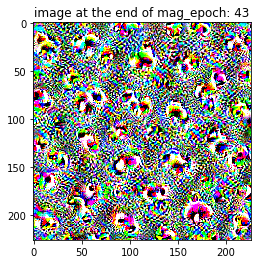

begin mag_epoch 44, activation: 5.037359237670898
end mag_epoch: 44, activation: 27.13153648376465


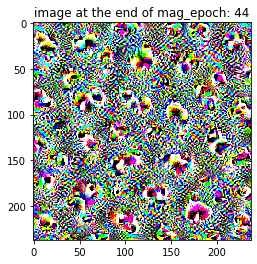

begin mag_epoch 45, activation: 4.771661281585693
end mag_epoch: 45, activation: 26.615734100341797


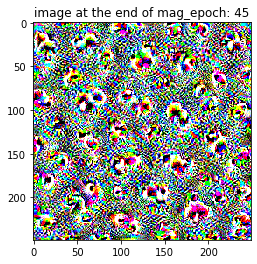

In [89]:
unit_idx = 11 # the neuron to visualize

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        loss = -layer_out[0, unit_idx].mean()
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [90]:
img_tensor.shape

torch.Size([3, 261, 261])

Simply scaling up the image slowly does not seem ameliorate the issue :(

## Trial 3: Activation maximization with RMS activation

In my experiments so far, I had defined activation of a unit to be the average of the elements in the output tensor of that unit. Loss was then defined to be the negative of this activation. Let me consider a new definition of activation: root-mean-squared value of the elements in the output tensor.

### Generating an inital random image

In [23]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


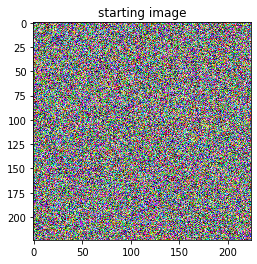

In [24]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [25]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image

epoch: 0/10000, activation: 0.04625428467988968


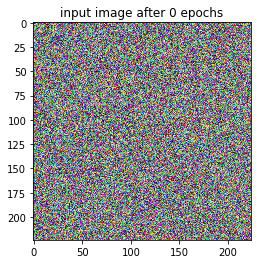

epoch: 1000/10000, activation: 30.478178024291992


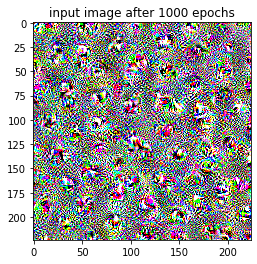

epoch: 2000/10000, activation: 52.91881561279297


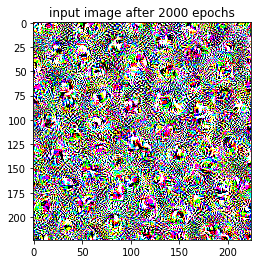

epoch: 3000/10000, activation: 75.82505798339844


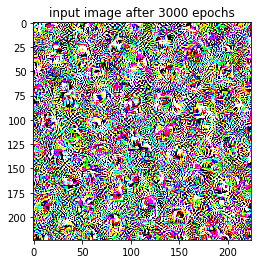

epoch: 4000/10000, activation: 99.19580841064453


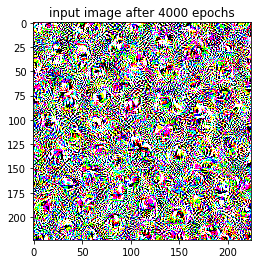

epoch: 5000/10000, activation: 122.96466064453125


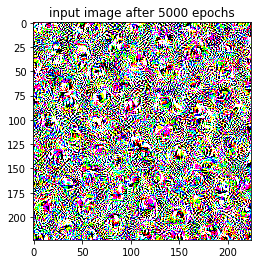

epoch: 6000/10000, activation: 146.92515563964844


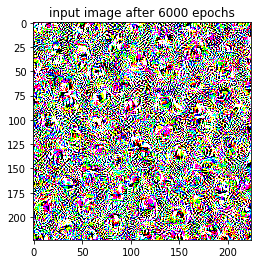

epoch: 7000/10000, activation: 171.2114715576172


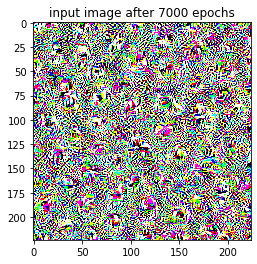

epoch: 8000/10000, activation: 195.7802734375


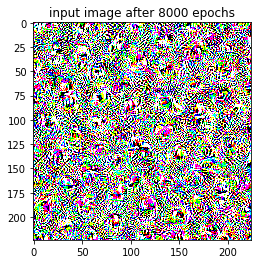

epoch: 9000/10000, activation: 220.46160888671875


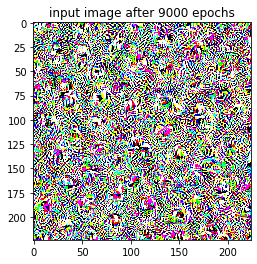

In [26]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 10000
display_every = 1000
unit_idx = 11 # unit of the convolution layer that we wish to visualize

for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    model(img_tensor.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    loss = - rms
    loss.backward()
    optimizer.step()
    # normalize the updated img_tensor to have pytorch specified mean and std. dev.
    # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
    # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
    # Will have to understand this further  
    
    if epoch % display_every == 0:
        print('epoch: {}/{}, activation: {}'.format(epoch, num_epochs, -loss))
        plt.imshow(image_converter(img_tensor))
        plt.title('input image after {} epochs'.format(epoch))
        plt.show()

This does not help either!

## Trial 4: Activation Maximization with Regularization

Various papers such as [this](https://arxiv.org/pdf/1312.6034.pdf), [this](https://arxiv.org/pdf/1512.02017.pdf) and [this](https://arxiv.org/pdf/1904.08939.pdf) have stressed on the need for regularization in order to obtain interpretable results from activation maximization. For starters, let's try an L2-regularization on pixel values as was done in [this](https://arxiv.org/pdf/1312.6034.pdf) paper. 

### Generating an inital random image

In [77]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
img_mean = [img[idx].mean() for idx in range(3)]
img_dev = [img[idx].std() for idx in range(3)]
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype))
print("mean: {}, std_dev: {}".format(img_mean, img_dev ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))
norm_img_mean = [img_tensor[idx].mean().item() for idx in range(3)]
norm_img_dev = [img_tensor[idx].std().item() for idx in range(3)]
print("mean of normalized image: {}".format(norm_img_mean))
print("std. dev of normalized image: {}".format(norm_img_dev))

img_shape:(3, 224, 224), img_dtype: float32
mean: [0.50056946, 0.4980354, 0.49975982], std_dev: [0.2890514, 0.28878716, 0.28966802]
mean of normalized image: [0.06798864901065826, 0.18765804171562195, 0.41671061515808105]
std. dev of normalized image: [1.262245774269104, 1.289241075515747, 1.2874263525009155]


In [78]:
(0.5000887-0.485)/(0.229)

0.0658895196506553

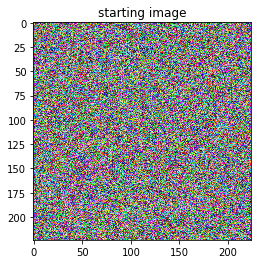

In [79]:
# Starting Image
plt.imshow(image_converter(img_tensor))                                                               
plt.title('starting image')
plt.show()

In [80]:
# move the model and input image to the GPU (if available) 
# This should be done before defining an optimizer
# This is mentioned in the following pytorch page: https://pytorch.org/docs/master/optim.html
# Also see the discussion here: https://discuss.pytorch.org/t/effect-of-calling-model-cuda-after-constructing-an-optimizer/15165/7
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)
#img_tensor = img_tensor.to(device).requires_grad_(True) # move the image tensor to cuda 
                                                        # set its requires_grad_ flag to be true

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
#print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
#print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

#optimizer = optim.Adam([img_tensor], lr = 0.01)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Generating the final image

Optimization for pixel regularization constant: 0, initial activation: 0.04853007569909096
pixel regularization constant: 0, activation: 15.00914478302002


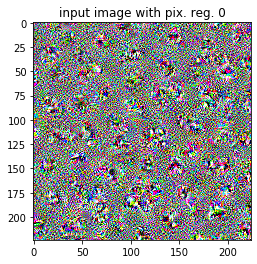

Optimization for pixel regularization constant: 5, initial activation: 0.04853007569909096
pixel regularization constant: 5, activation: 14.062283515930176


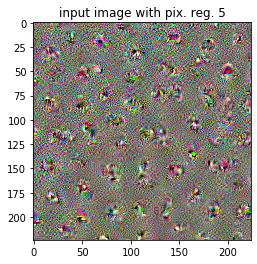

Optimization for pixel regularization constant: 10, initial activation: 0.04853007569909096
pixel regularization constant: 10, activation: 13.149080276489258


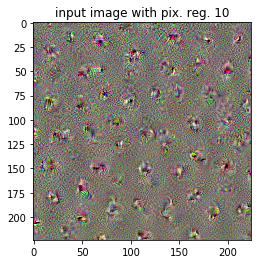

Optimization for pixel regularization constant: 15, initial activation: 0.04853007569909096
pixel regularization constant: 15, activation: 12.750381469726562


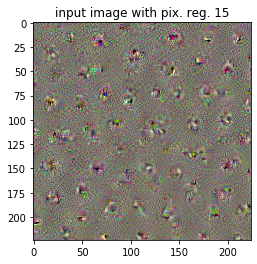

Optimization for pixel regularization constant: 20, initial activation: 0.04853007569909096
pixel regularization constant: 20, activation: 12.191788673400879


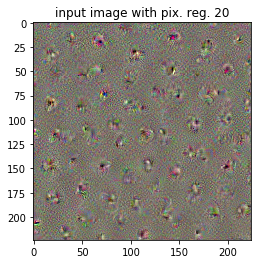

Optimization for pixel regularization constant: 25, initial activation: 0.04853007569909096
pixel regularization constant: 25, activation: 11.738006591796875


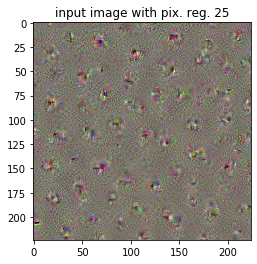

Optimization for pixel regularization constant: 30, initial activation: 0.04853007569909096
pixel regularization constant: 30, activation: 11.562224388122559


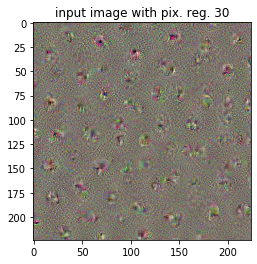

In [83]:
# Since we are not training googlenet here, therefore we should use evaluation mode 
# this is because batch-normalization layers in googlenet will have different behaviour in traning vs evaluation modes
model.eval()


num_epochs = 300
unit_idx = 11 # unit of the convolution layer that we wish to visualize
pix_reg_high = 30 # upper bound on regularization constants for pixel intensities
pix_reg_step = 5 # step size by which to increase pixel regularizer in each step
lr = 0.01 # learning rate 

for pix_reg in range(0, pix_reg_high+1, pix_reg_step):
    image = img_tensor.clone().detach().to(device).requires_grad_(True)
    optimizer = optim.Adam([image], lr = lr)
    
    # act. value before optimization
    optimizer.zero_grad()
    model(image.unsqueeze(0))
    layer_out = activation['4a']
    rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
    print('Optimization for pixel regularization constant: {}, initial activation: {}'.format(pix_reg, rms))
    
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        model(image.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow(torch.pow(layer_out[0, unit_idx],2).mean(), 0.5)
        loss = - rms + pix_reg*((image**2).mean())
        loss.backward()
        optimizer.step()
        # normalize the updated img_tensor to have pytorch specified mean and std. dev.
        # img_tensor = normalize(img_tensor.clone().detach()).requires_grad_(True)
        # the above step of renormalizing the updated img_tensor does not work: the activation remains frozen at ~ 2.368 and no patterns seem to develop in the image
        # Will have to understand this further  
    
    # display the image generated for each value of pix_reg  
    print('pixel regularization constant: {}, activation: {}'.format(pix_reg, rms))
    plt.imshow(image_converter(image))
    plt.title('input image with pix. reg. {}'.format(pix_reg))
    plt.show()

Just adding an L2 regularizer for pixel intensities also does not seem to help much, except that it suppresses the background of the final image. 

## Trial 5: Activation Maximization with scaling and L2 reg. for pixel intensity

Let us try to combine the techniques in Trial 2 and 4

In [17]:
# generating the initial image with random pixel values between 0 and 1
H = 224 # height of input image
W = 224 # width of input image
img = np.single(np.random.uniform(0,1, (3, H, W))) # we need the pixel values to be of type float32 hence np.single 
print("img_shape:{}, img_dtype: {}".format(img.shape, img.dtype ))
# convert the image to a torch tensor with the requisite mean and std. dev. 
img_tensor = normalize(torch.from_numpy(img))

img_shape:(3, 224, 224), img_dtype: float32


In [18]:
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 50 # no. of times to optimize an input image before upscaling

In [19]:
import cv2 # for resizing images
# Note that we could have also used torchvision.transforms.Resize() method provided in Pytorch
# we used cv2 for no particular reason other than to try cv2
# for more info on torchvision.transforms.Resize() see https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize


# e.g. of how to resize images using cv2
# just like in plt.imshow() cv2 also expects the channel info. to be in the last axis
# the documentation for cv2.resize() recommends using inter_cubic for interpolation when upscaling
cv2.resize(image_converter(img_tensor), dsize = (0,0) , fx = upscaling_factor, fy = upscaling_factor, 
           interpolation = cv2.INTER_CUBIC).shape 

(235, 235, 3)

In [20]:
# move the model to CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Calculations being executed on {}'.format(device))

model.to(device)

Calculations being executed on cuda


GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

### Creating a initial image with random pixels

In [21]:
# initial random image
H = 28 # height of image
W = 28 # width of image
im = np.single(np.random.uniform(0, 1, (3, H, W))) # we need the pixel values to be of type float32 
img_tensor = normalize(torch.from_numpy(im)).to(device).requires_grad_(True)
print('image shape: {}, device: {}, dtype: {}'.format(img_tensor.shape, 
                                                      img_tensor.device, img_tensor.dtype ))

# check that the model and img_tensor are on cuda or not
# https://discuss.pytorch.org/t/how-to-check-if-model-is-on-cuda/180
print('googlenet is on cuda: {}'.format(next(model.parameters()).is_cuda))
print('img_tensor is on cuda: {}'.format(img_tensor.is_cuda))

optimizer = optim.Adam([img_tensor], lr = 0.01)

image shape: torch.Size([3, 28, 28]), device: cuda:0, dtype: torch.float32
googlenet is on cuda: True
img_tensor is on cuda: True


### Generating the final image 

begin mag_epoch 0, activation: -16.55048942565918
end mag_epoch: 0, activation: 13.731157302856445


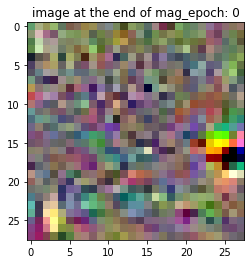

begin mag_epoch 1, activation: 7.139713287353516
end mag_epoch: 1, activation: 16.495372772216797


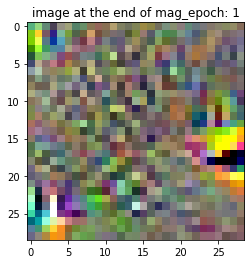

begin mag_epoch 2, activation: 7.215749740600586
end mag_epoch: 2, activation: 16.81429672241211


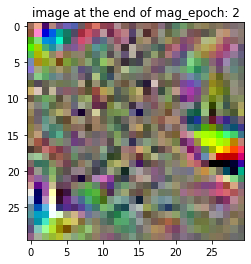

begin mag_epoch 3, activation: 2.452662467956543
end mag_epoch: 3, activation: 14.866219520568848


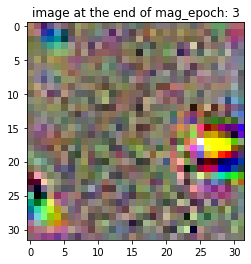

begin mag_epoch 4, activation: 5.216424465179443
end mag_epoch: 4, activation: 14.715507507324219


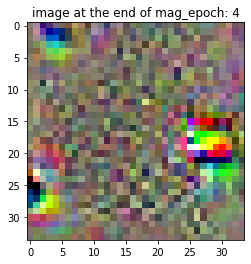

begin mag_epoch 5, activation: 5.981203079223633
end mag_epoch: 5, activation: 16.109018325805664


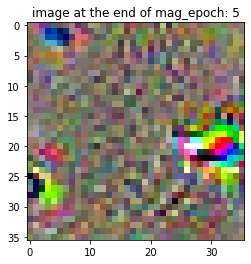

begin mag_epoch 6, activation: 5.429405689239502
end mag_epoch: 6, activation: 15.218962669372559


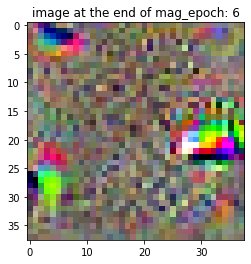

begin mag_epoch 7, activation: 4.606861114501953
end mag_epoch: 7, activation: 15.38857650756836


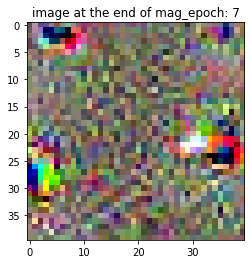

begin mag_epoch 8, activation: 5.803065299987793
end mag_epoch: 8, activation: 16.324134826660156


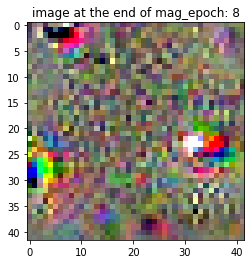

begin mag_epoch 9, activation: 5.73712158203125
end mag_epoch: 9, activation: 16.28470230102539


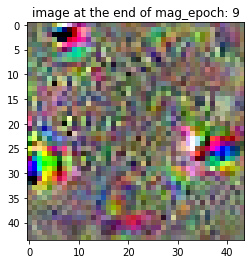

begin mag_epoch 10, activation: 5.712486267089844
end mag_epoch: 10, activation: 17.291948318481445


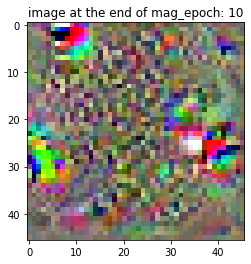

begin mag_epoch 11, activation: 2.1452507972717285
end mag_epoch: 11, activation: 12.040722846984863


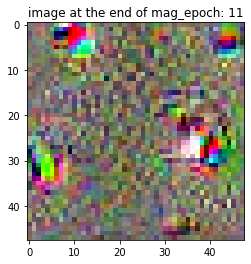

begin mag_epoch 12, activation: 4.159051418304443
end mag_epoch: 12, activation: 13.43490219116211


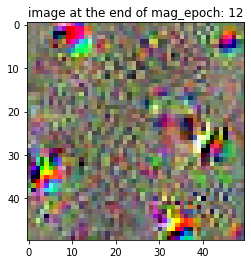

begin mag_epoch 13, activation: 4.3805742263793945
end mag_epoch: 13, activation: 14.201204299926758


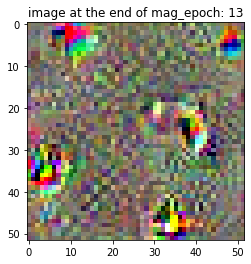

begin mag_epoch 14, activation: 4.201753616333008
end mag_epoch: 14, activation: 16.644184112548828


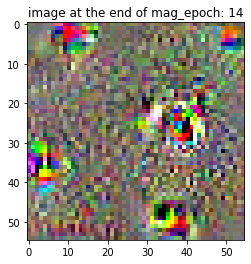

begin mag_epoch 15, activation: 4.30543327331543
end mag_epoch: 15, activation: 16.485172271728516


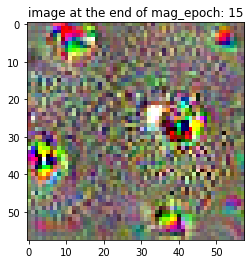

begin mag_epoch 16, activation: 5.196399688720703
end mag_epoch: 16, activation: 17.931346893310547


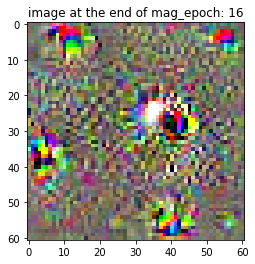

begin mag_epoch 17, activation: 2.5913491249084473
end mag_epoch: 17, activation: 13.408670425415039


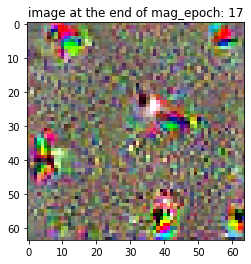

begin mag_epoch 18, activation: 4.513165473937988
end mag_epoch: 18, activation: 14.513221740722656


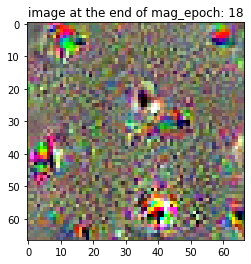

begin mag_epoch 19, activation: 4.317145347595215
end mag_epoch: 19, activation: 15.657367706298828


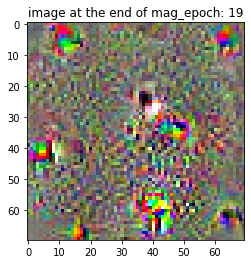

begin mag_epoch 20, activation: 3.6900017261505127
end mag_epoch: 20, activation: 15.957243919372559


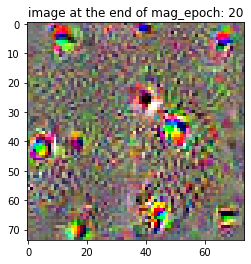

begin mag_epoch 21, activation: 4.018226623535156
end mag_epoch: 21, activation: 18.15768814086914


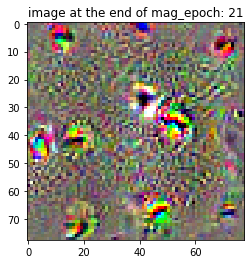

begin mag_epoch 22, activation: 2.8791208267211914
end mag_epoch: 22, activation: 15.60301685333252


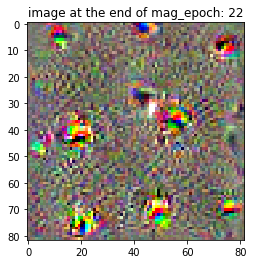

begin mag_epoch 23, activation: 3.4594717025756836
end mag_epoch: 23, activation: 16.713619232177734


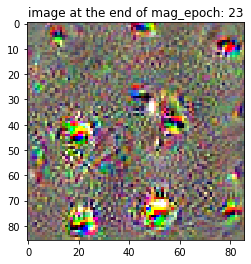

begin mag_epoch 24, activation: 3.1803383827209473
end mag_epoch: 24, activation: 16.765233993530273


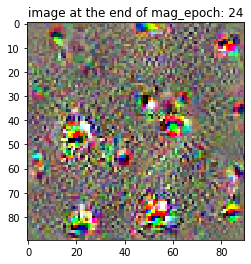

begin mag_epoch 25, activation: 3.160024404525757
end mag_epoch: 25, activation: 16.56842041015625


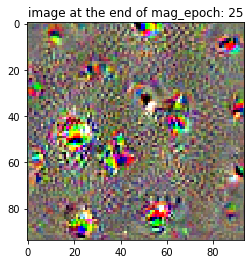

begin mag_epoch 26, activation: 2.3823089599609375
end mag_epoch: 26, activation: 15.976394653320312


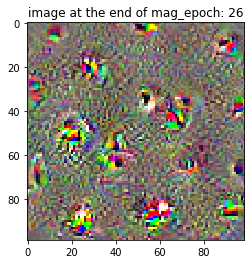

begin mag_epoch 27, activation: 3.043269157409668
end mag_epoch: 27, activation: 16.28359603881836


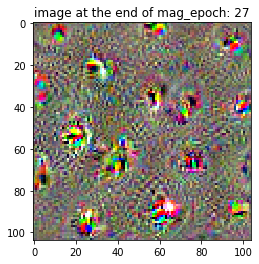

begin mag_epoch 28, activation: 3.151705026626587
end mag_epoch: 28, activation: 17.97661781311035


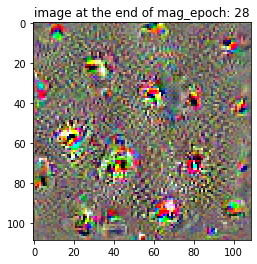

begin mag_epoch 29, activation: 2.7516353130340576
end mag_epoch: 29, activation: 16.51308822631836


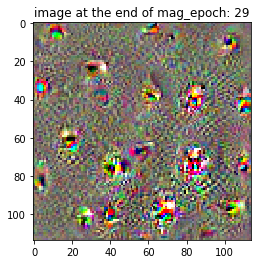

begin mag_epoch 30, activation: 3.5780911445617676
end mag_epoch: 30, activation: 17.421096801757812


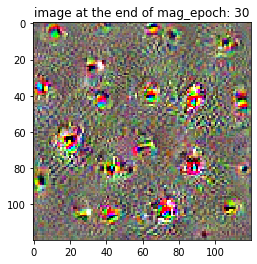

begin mag_epoch 31, activation: 3.2885985374450684
end mag_epoch: 31, activation: 18.676401138305664


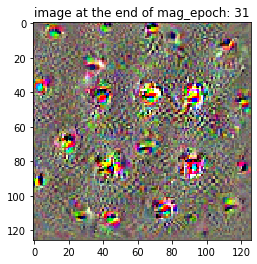

begin mag_epoch 32, activation: 2.710266351699829
end mag_epoch: 32, activation: 15.923425674438477


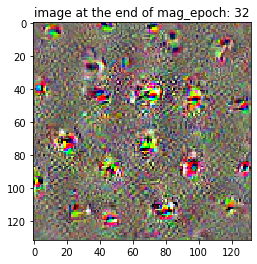

begin mag_epoch 33, activation: 3.1632368564605713
end mag_epoch: 33, activation: 17.148942947387695


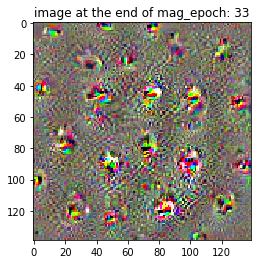

begin mag_epoch 34, activation: 2.8908493518829346
end mag_epoch: 34, activation: 17.09225845336914


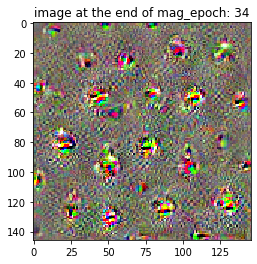

begin mag_epoch 35, activation: 3.3071765899658203
end mag_epoch: 35, activation: 17.74669647216797


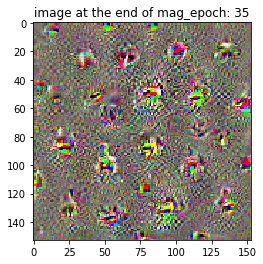

begin mag_epoch 36, activation: 2.691762685775757
end mag_epoch: 36, activation: 16.027402877807617


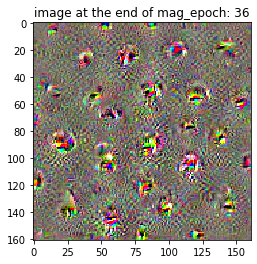

begin mag_epoch 37, activation: 3.208437442779541
end mag_epoch: 37, activation: 16.38776206970215


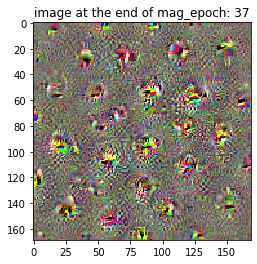

begin mag_epoch 38, activation: 2.961376428604126
end mag_epoch: 38, activation: 15.880316734313965


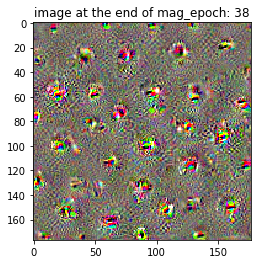

begin mag_epoch 39, activation: 3.454620838165283
end mag_epoch: 39, activation: 17.216344833374023


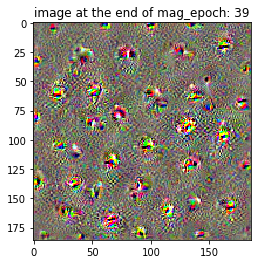

begin mag_epoch 40, activation: 3.116849899291992
end mag_epoch: 40, activation: 16.09100341796875


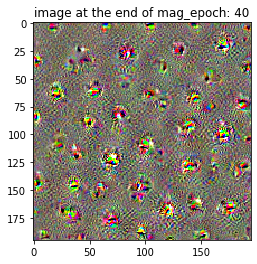

begin mag_epoch 41, activation: 3.188568115234375
end mag_epoch: 41, activation: 17.148345947265625


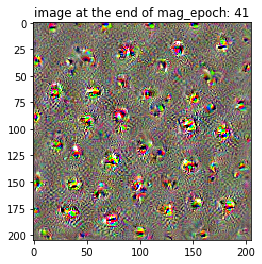

begin mag_epoch 42, activation: 2.987352132797241
end mag_epoch: 42, activation: 16.680164337158203


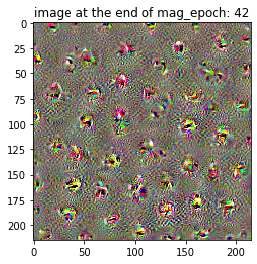

begin mag_epoch 43, activation: 2.948004961013794
end mag_epoch: 43, activation: 16.100048065185547


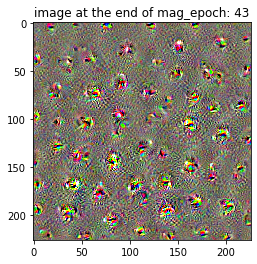

begin mag_epoch 44, activation: 3.165046215057373
end mag_epoch: 44, activation: 17.11238670349121


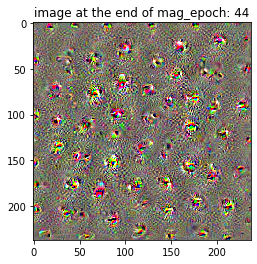

begin mag_epoch 45, activation: 2.7766060829162598
end mag_epoch: 45, activation: 16.6065673828125


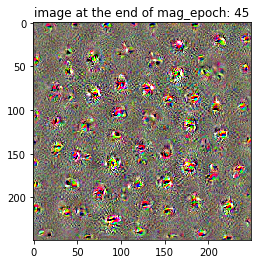

In [22]:
unit_idx = 11 # the neuron to visualize
pix_reg = 10

model.eval()
for mag_epoch in range(upscaling_steps+1):
    optimizer = optim.Adam([img_tensor], lr = 0.4)
    
    for opt_epoch in range(optim_steps):
        optimizer.zero_grad()
        model(img_tensor.unsqueeze(0))
        layer_out = activation['4a']
        rms = torch.pow((layer_out[0, unit_idx]**2).mean(), 0.5)
        loss = -rms + pix_reg*((img_tensor**2).mean())
        # print activation at the beginning of each mag_epoch
        if opt_epoch == 0:
            print('begin mag_epoch {}, activation: {}'.format(mag_epoch, -loss))
        loss.backward()
        optimizer.step()
        
    # view the result of optimising the image
    print('end mag_epoch: {}, activation: {}'.format(mag_epoch, -loss))
    img = image_converter(img_tensor)    
    plt.imshow(img)
    plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    plt.show()
    
    img = cv2.resize(img, dsize = (0,0), 
                     fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
    img_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

In [23]:
img_tensor.shape

torch.Size([3, 261, 261])